## Installing dependencies

In [ ]:
!pip install roboflow
!pip install ultralytics
!pip install ipyplot
!pip install -U torch sahi

## Checking out our training environment

In [4]:
import torch
# from IPython.display import Image
import ipyplot

print(f"torch {torch.__version__}, {torch.cuda.get_device_properties(0) if torch.cuda.torch.is_vulkan_available() else 'CPU'}")


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        
torch 2.0.1+cu118, CPU


## Importing Dataset From Roboflow

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="*****************")
project = rf.workspace("atlas-university-of-illinois").project("quad-cam-pedestrian")
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.128, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to Quad-Cam-Pedestrian-2 in yolov8:: 100%|██████████| 809/809 [00:00<00:00, 1149.11it/s]


## Training Model with Out-of-the-box YOLOv8s

In [6]:
from ultralytics import YOLO
from google.colab import drive

model = YOLO('yolov8s.pt')
location = dataset.location + "/data.yaml"
results = model.train(data=location, epochs=10)

10 epochs completed in 0.046 hours.

### Moving our runs to our ATLAS Folder

In [9]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

%cp -av '/content/runs' '/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/training_runs'

### Training Results


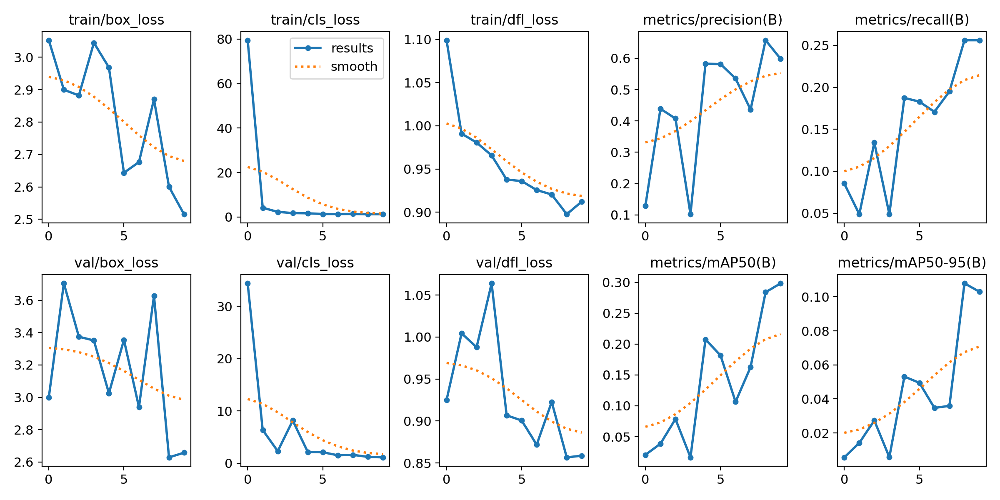
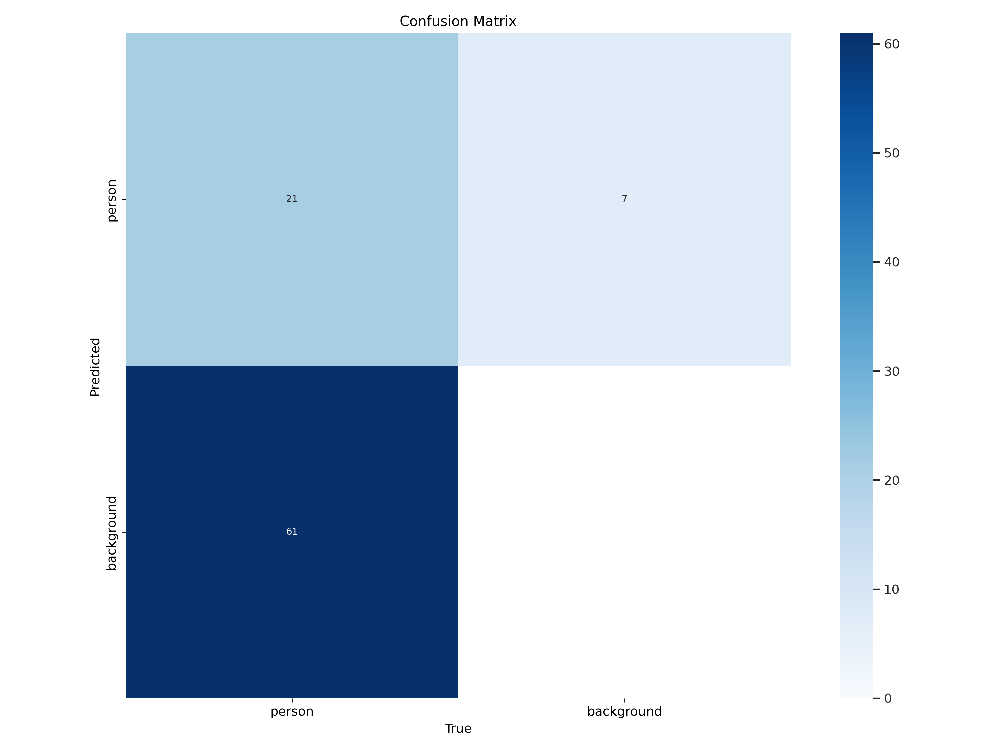


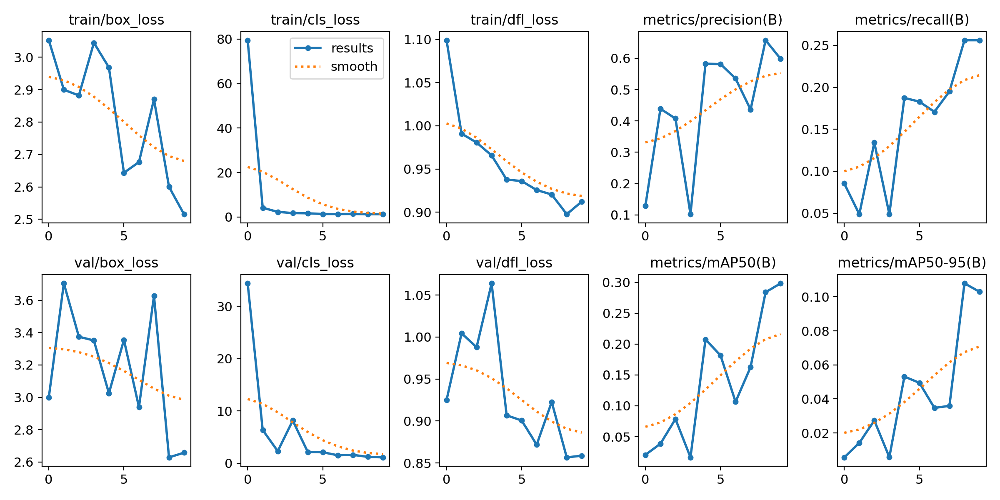
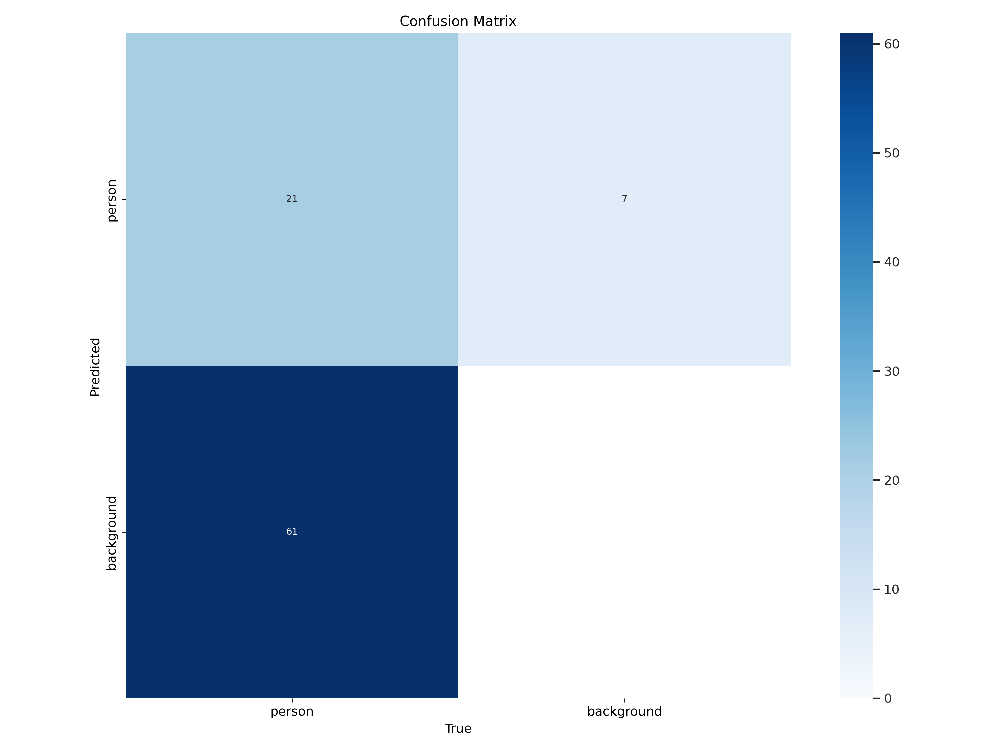

In [27]:
plots = ['/content/runs/detect/train/results.png', '/content/runs/detect/train/confusion_matrix.png']
ipyplot.plot_images(plots, force_b64=True, img_width=750)

So, as seen by the plots, the model had a high Type II Error (Predicted the background when it was actually a person - FN). Additionaly, the mAP and loss fluctuated heavily. mAP decreased even during later epochs and loss also increased during the later epochs which isn't what we want.

### Testing our Model

In [7]:
from google.colab.patches import cv2_imshow
# At conf level 65 - 0 detections
# test1 = model.predict('/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png', save=True, save_conf=True)
# Image('/content/runs/detect/predict2/0031.png')
test1 = model('/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png')
cv2_imshow(test1[0].plot())
print("The number of people in this image are ", test1[0].boxes.data.size()[0])
print("The actual number of people in this image are 8 people (6  in the front, 1 blurry mid right, 1 blurry in the back-left)")


image 1/1 /content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png: 384x640 2 persons, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


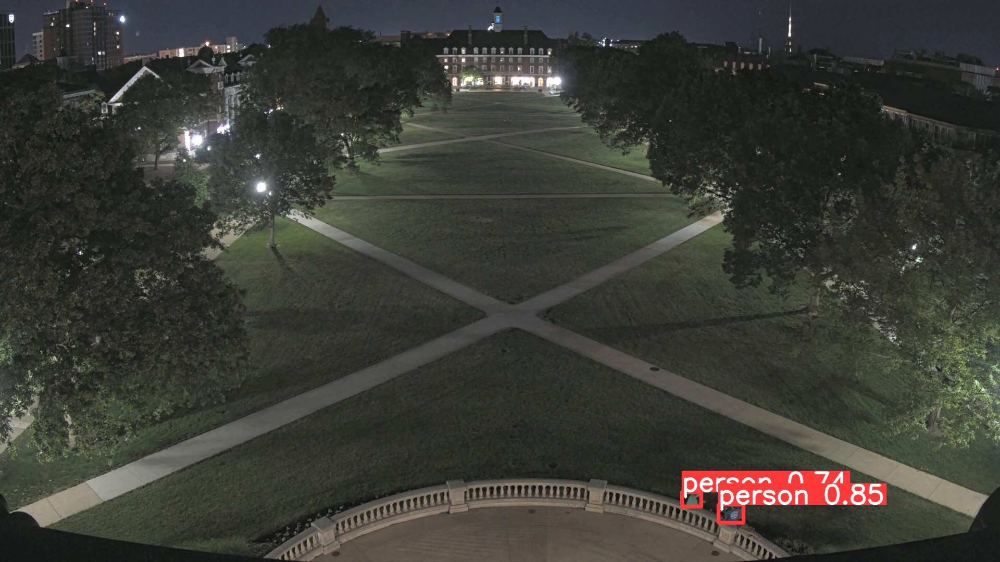

The number of people in this image are  2
The actual number of people in this image are 4 people (2  in the front and 2 blurry in the back)


In [17]:
test2 = model('/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png')
cv2_imshow(test2[0].plot())
print("The number of people in this image are ", test2[0].boxes.data.size()[0])
print("The actual number of people in this image are 4 people (2  in the front and 2 blurry in the back)")

## Training Model with YOLOv8s-p2

This model is a variant of the YOLOv8 model designed for better performance on small objects. It includes feature pyramid levels compared to the original YOLOv8 model, which enables it detect and localize smaller objects more accurately.

In [29]:
model2 = YOLO('yolov8s-p2.yaml').load('yolov8s.pt')
results2 = model2.train(data=location, epochs=10)


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

%cp -av '/content/runs/detect/train2' '/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/training_runs/runs/detect/train2'

### Results - Plots

10 epochs completed in 0.054 hrs


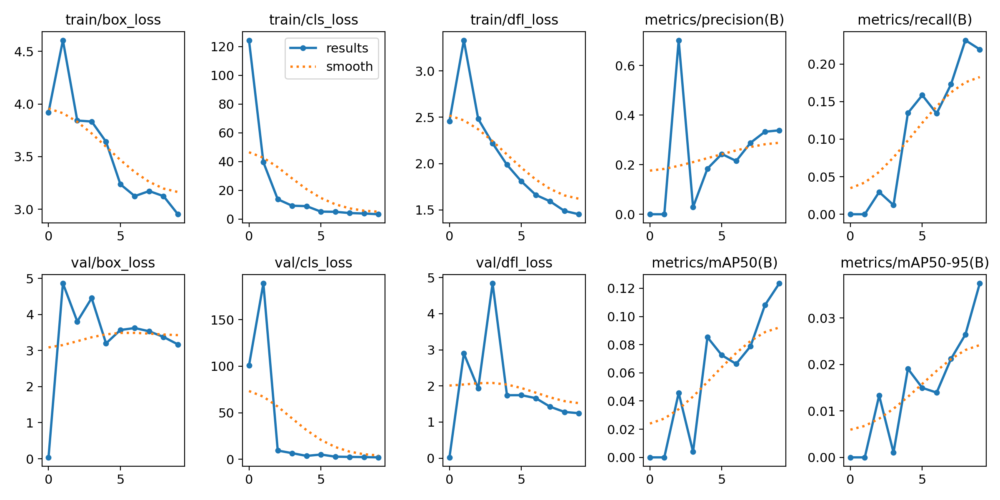
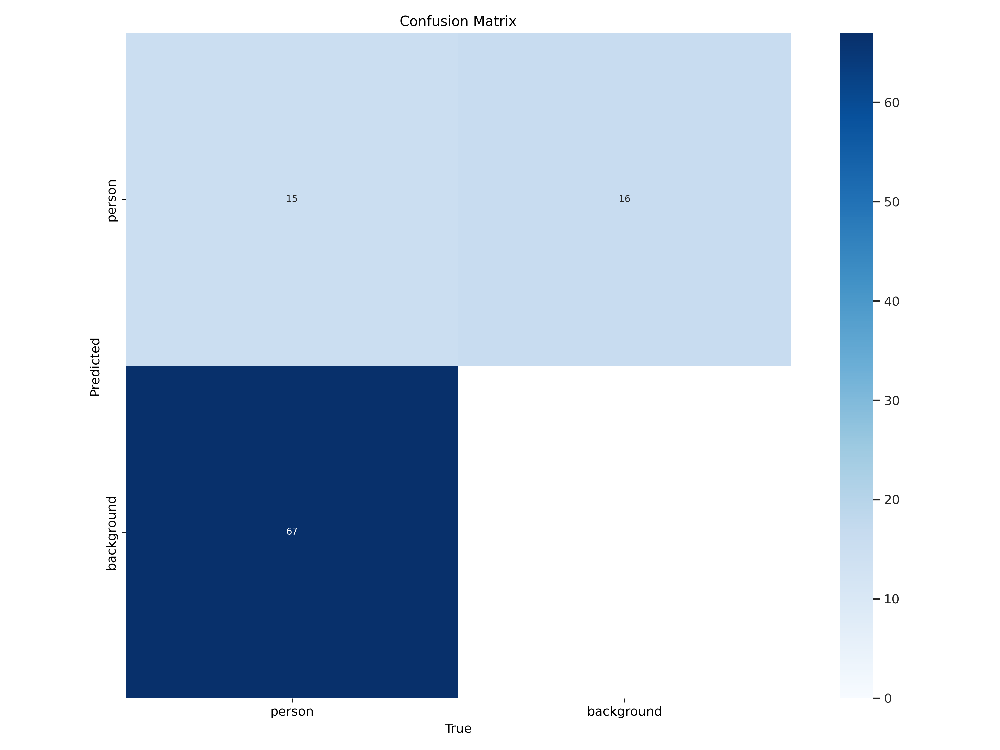


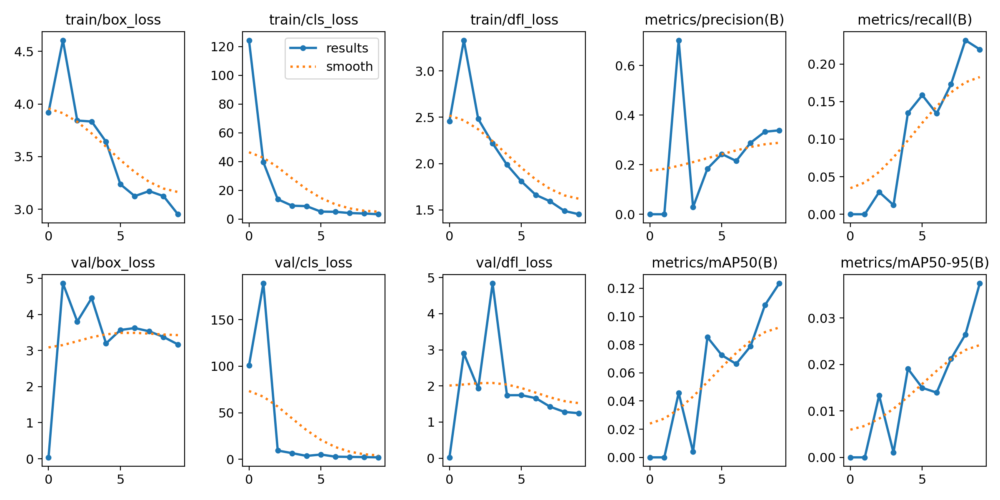
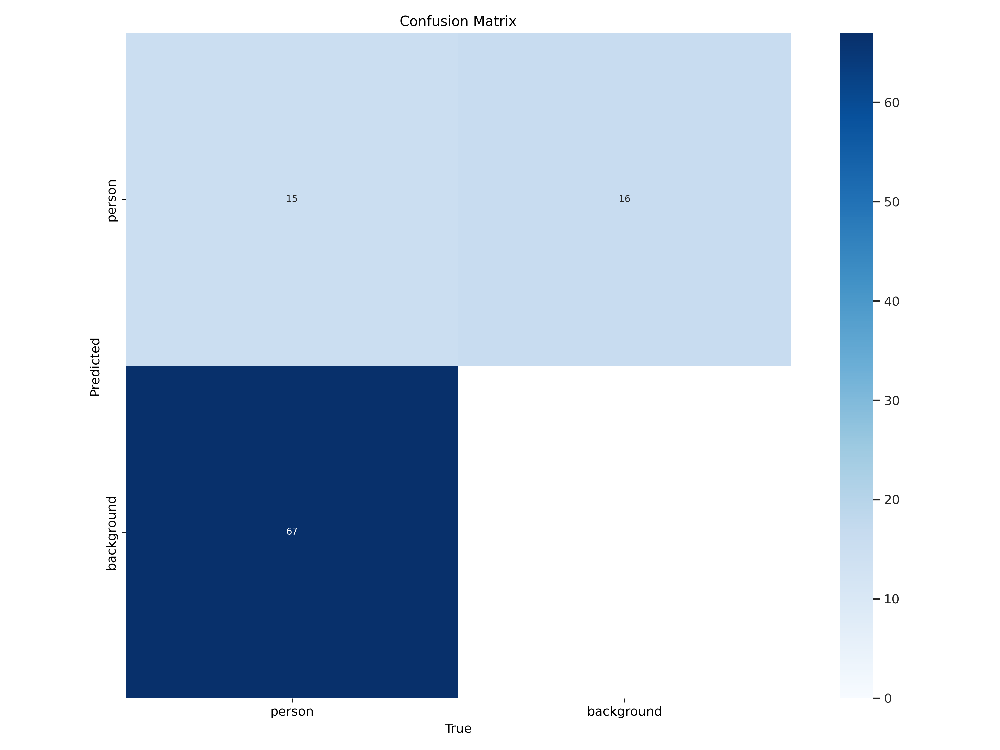

In [33]:
plots2 = ['/content/runs/detect/train2/results.png', '/content/runs/detect/train2/confusion_matrix.png']
ipyplot.plot_images(plots2, force_b64=True, img_width=750)

So, surprisingly, we had both higher Type I and Type II Error. However, there's less fluctuation with mAP and loss as the epochs increased. As such, this method may prove useful if trained for more epochs.

### Testing Random Images


image 1/1 /content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png: 384x640 7 persons, 21.6ms
Speed: 1.8ms preprocess, 21.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


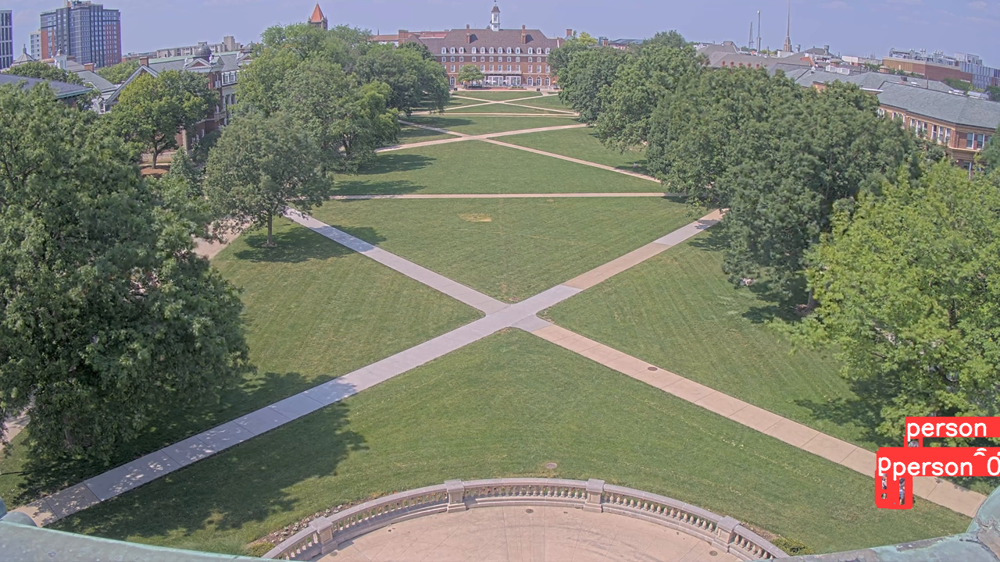


image 1/1 /content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png: 384x640 1 person, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


The number of people in this image are  7
The actual number of people in this image are 8 people (6  in the front, 1 blurry mid right, 1 blurry in the back-left)


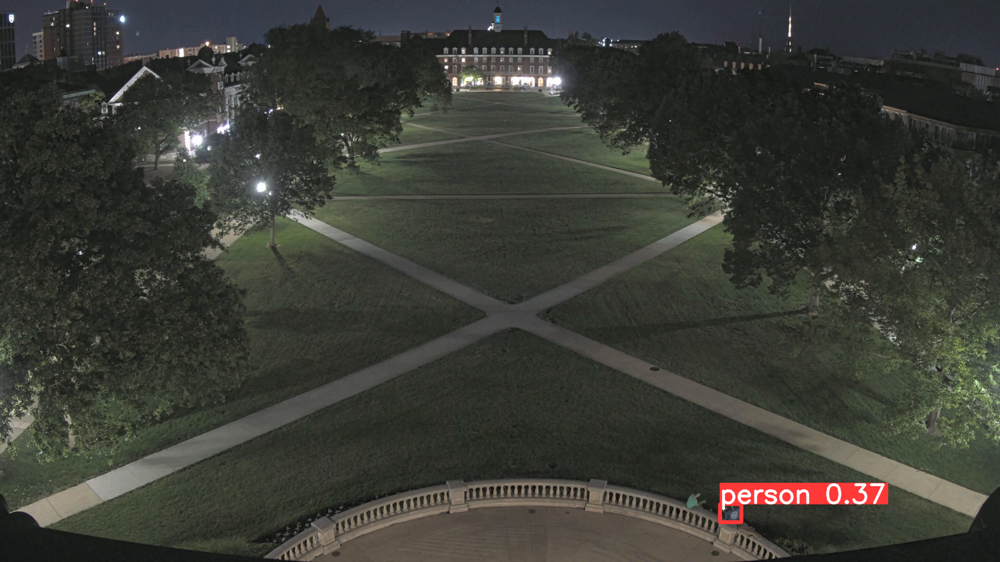

The number of people in this image are  1
The actual number of people in this image are 4 people (2  in the front and 2 blurry in the back)


In [34]:
pred_1_v2 = model2('/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png')
cv2_imshow(pred_1_v2[0].plot())
print("The number of people in this image are ", pred_1_v2[0].boxes.data.size()[0])
print("The actual number of people in this image are 8 people (6  in the front, 1 blurry mid right, 1 blurry in the back-left)")

pred_2_v2 = model2('/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png')
cv2_imshow(pred_2_v2[0].plot())
print("The number of people in this image are ", pred_2_v2[0].boxes.data.size()[0])
print("The actual number of people in this image are 4 people (2  in the front and 2 blurry in the back)")

## Running Inference with SAHI (Slicing Aided Hyper Inference)




*   Importing requried modules



In [93]:
from sahi.utils.yolov8 import (
    download_yolov8s_model,
)

from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image
from IPython.display import display


*   Get our pretrained yolov8 models and creating the detection models




In [85]:
yolov8_model1_path = "/content/models/model_1.pt"
yolov8_model2_path = "/content/models/model_2.pt"

detection_model1 = AutoDetectionModel.from_pretrained(
    model_type='yolov8',
    model_path=yolov8_model1_path,
    confidence_threshold=0.5,
    device="cpu", # or 'cuda:0'
)

detection_model2 = AutoDetectionModel.from_pretrained(
    model_type='yolov8',
    model_path=yolov8_model2_path,
    confidence_threshold=0.1,
    device="cpu", # or 'cuda:0'
)



### Using sliced inference with First Model

To perform sliced prediction we need to specify slice parameters. In this case, we will perform prediction over slices of 255x495 with an overlap ratio of 0.2:


In [86]:
# Using our first trained model
model1_result1 = get_sliced_prediction(
    "/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png",
    detection_model1,
    slice_height = 195, # went from 256x256 to 495x255
    slice_width = 250,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    postprocess_type="NMS"
)

model1_result2 = get_sliced_prediction(
    "/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png",
    detection_model1,
    slice_height = 195,
    slice_width = 250,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    postprocess_type="NMS"
)

Performing prediction on 70 number of slices.
Performing prediction on 35 number of slices.


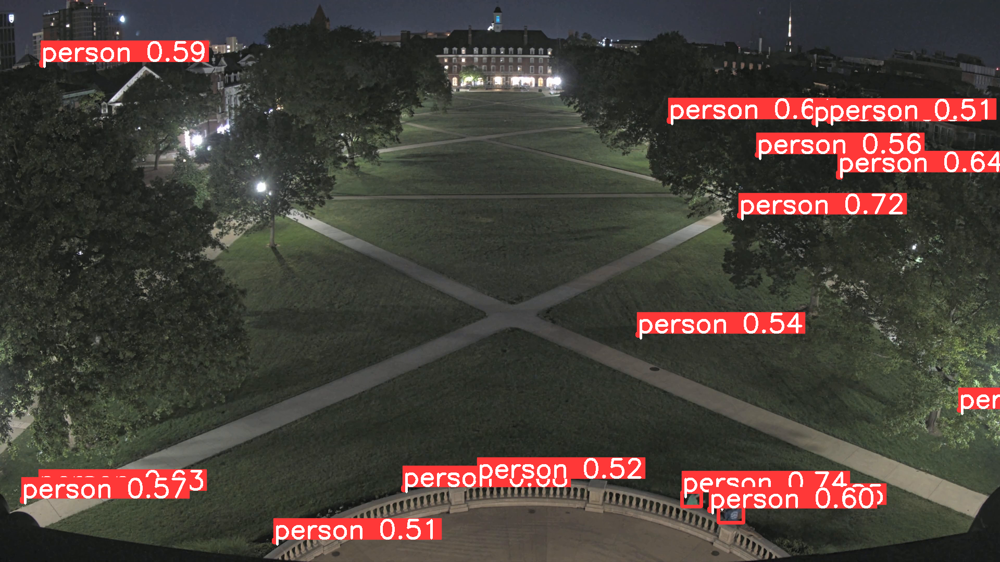

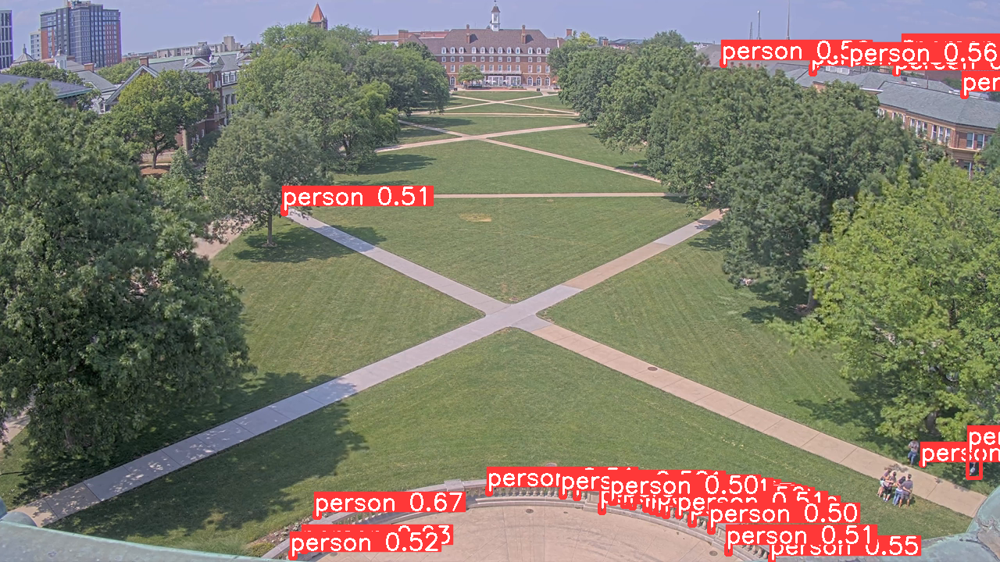

In [95]:
model1_result1.export_visuals(export_dir="/content/sahi_results", file_name="model1_result1")
model1_result2.export_visuals(export_dir="/content/sahi_results", file_name="model1_result2")

images_model1 = [Image(filename='/content/sahi_results/model1_result1.png'), Image(filename='/content/sahi_results/model1_result2.png')]
display(*images_model1)

In [ ]:
object_prediction_list = model1_result2.object_prediction_list
scores = []
for i in range(len(object_prediction_list)):
  scores.append(object_prediction_list[i].score.value)

In [ ]:
scores.sort(reverse=True)
scores

### Using Sliced Inference With Second Model

In [96]:
model2_result1 = get_sliced_prediction(
    "/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/9hr/0313.png",
    detection_model2,
    slice_height = 195,
    slice_width = 250,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    postprocess_type="NMS"
)

model2_result2 = get_sliced_prediction(
    "/content/gdrive/MyDrive/ATLAS AI [SU23]/CV Project/Quad Cam Video/Images/35-2min/0031.png",
    detection_model2,
    slice_height = 195,
    slice_width = 250,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    postprocess_type="NMS"
)

Performing prediction on 70 number of slices.
Performing prediction on 35 number of slices.


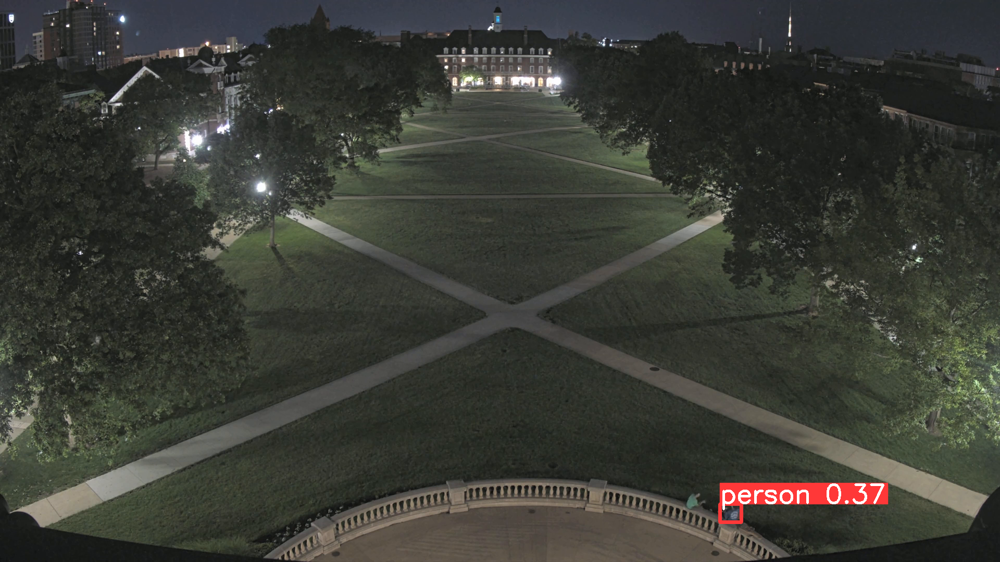

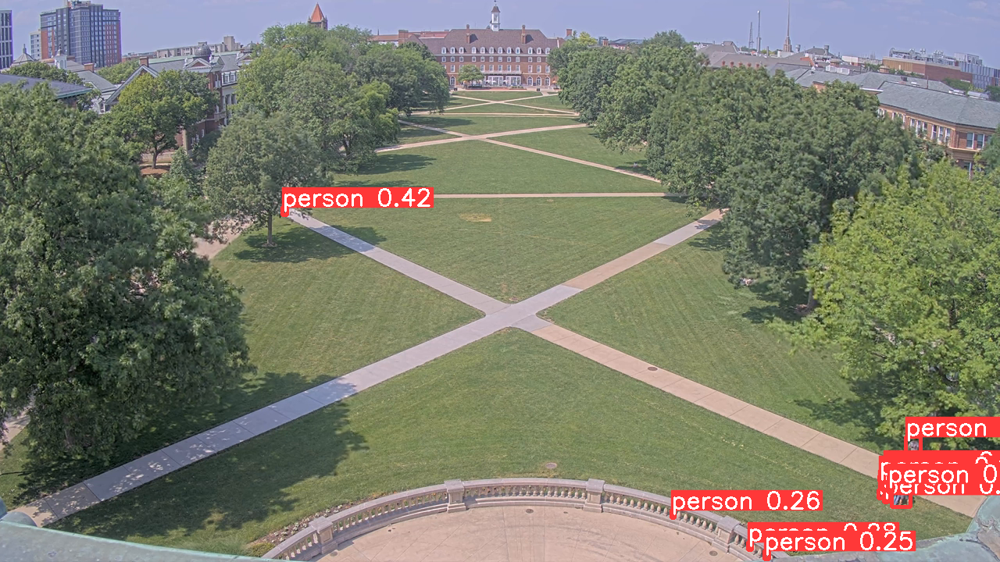

In [98]:
model2_result1.export_visuals(export_dir="/content/sahi_results", file_name="model2_result1")
model2_result2.export_visuals(export_dir="/content/sahi_results", file_name="model2_result2")

images_model2 = [Image(filename='/content/sahi_results/model2_result1.png'), Image(filename='/content/sahi_results/model2_result2.png')]
display(*images_model2)

In [100]:
object_prediction_list = model2_result2.object_prediction_list
scores = []
for i in range(len(object_prediction_list)):
  scores.append(object_prediction_list[i].score.value)

In [101]:
scores.sort(reverse=True)
scores

[0.5678175687789917,
 0.5641090869903564,
 0.4373661279678345,
 0.42929020524024963,
 0.42922601103782654,
 0.4203468859195709,
 0.41210174560546875,
 0.38376384973526,
 0.3554808795452118,
 0.3387860059738159,
 0.29162168502807617,
 0.28054025769233704,
 0.273721843957901,
 0.2580605745315552,
 0.257316529750824,
 0.25487929582595825]